In [1]:
# clone YOLOv5 and reset to a specific git checkpoint that has been verified working
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 6294, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (65/65), done.
remote: Total 6294 (delta 41), reused 59 (delta 24), pack-reused 6205
Receiving objects: 100% (6294/6294), 8.54 MiB | 30.16 MiB/s, done.
Resolving deltas: 100% (4295/4295), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 645kB 9.1MB/s 
Setup complete. Using torch 1.8.1+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [4]:
%cp /content/gdrive/MyDrive/cones/best.pt /content/yolov5/weights
%cp /content/gdrive/MyDrive/cones/detect.py /content/yolov5
%cp /content/gdrive/MyDrive/cones/plots.py /content/yolov5/utils

In [6]:
# no need to run for first time
%cd /content/yolov5/
!rm -rf images

/content/yolov5


In [7]:
%cp -av "/content/gdrive/MyDrive/cones/images" "/content/yolov5"

'/content/gdrive/MyDrive/cones/images' -> '/content/yolov5/images'
'/content/gdrive/MyDrive/cones/images/image1.jpg' -> '/content/yolov5/images/image1.jpg'
'/content/gdrive/MyDrive/cones/images/image2.jpg' -> '/content/yolov5/images/image2.jpg'
'/content/gdrive/MyDrive/cones/images/image12.jpg' -> '/content/yolov5/images/image12.jpg'
'/content/gdrive/MyDrive/cones/images/image13.jpg' -> '/content/yolov5/images/image13.jpg'
'/content/gdrive/MyDrive/cones/images/image4.jpg' -> '/content/yolov5/images/image4.jpg'
'/content/gdrive/MyDrive/cones/images/image3.jpg' -> '/content/yolov5/images/image3.jpg'
'/content/gdrive/MyDrive/cones/images/image5.jpg' -> '/content/yolov5/images/image5.jpg'
'/content/gdrive/MyDrive/cones/images/image6.jpg' -> '/content/yolov5/images/image6.jpg'
'/content/gdrive/MyDrive/cones/images/image10.jpg' -> '/content/yolov5/images/image10.jpg'
'/content/gdrive/MyDrive/cones/images/image11.jpg' -> '/content/yolov5/images/image11.jpg'
'/content/gdrive/MyDrive/cones/imag

In [8]:
from PIL import Image
import glob

for imageName in glob.glob('/content/yolov5/images/*.jpg'):
    basewidth = 640
    img = Image.open(imageName)
    wpercent = (basewidth/float(img.size[0]))
    hsize = int((float(img.size[1])*float(wpercent)))
    img = img.resize((basewidth,hsize), Image.NEAREST)
    img = img.convert("RGB")
    img.save(imageName)

In [25]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights weights/best.pt --conf 0.6 --source images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.6, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='images', update=False, view_img=False, weights=['weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 224 layers, 7053910 parameters, 0 gradients, 16.3 GFLOPS
image 1/64 /content/yolov5/images/image1.jpg: 480x640 2 cones, Done. (0.011s)
image 2/64 /content/yolov5/images/image10.jpg: 448x640 3 cones, Done. (0.010s)
image 3/64 /content/yolov5/images/image11.jpg: 544x640 Done. (0.011s)
image 4/64 /content/yolov5/images/image12.jpg: 640x448 1 cone, Done. (0.010s)
image 5/64 /content/yolov5/images/image13.jpg: 512x640 1 cone, Done. (0.010s)
image 6/64 /content/yolov5/images/image14.jpg: 448x640 2 cones, Done. (0.010s)
image 7/64 /content/yolov5/images/image15.jpg: 448x640 4 cones, Done. (0.010s)
ima

In [26]:
%ls runs/detect/

exp/  exp2/  exp3/  exp4/  exp5/  exp6/  exp7/


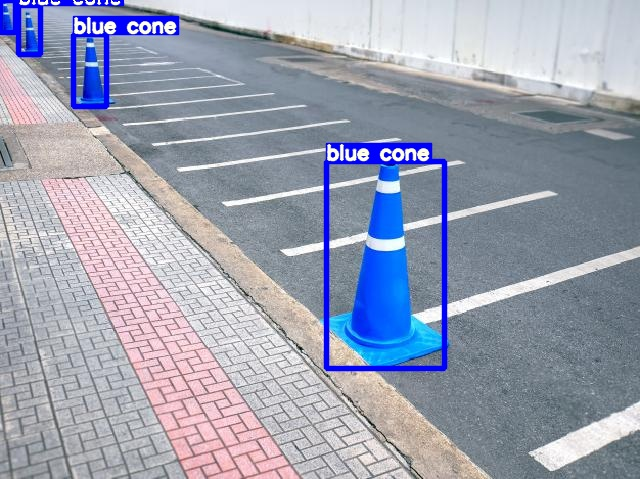

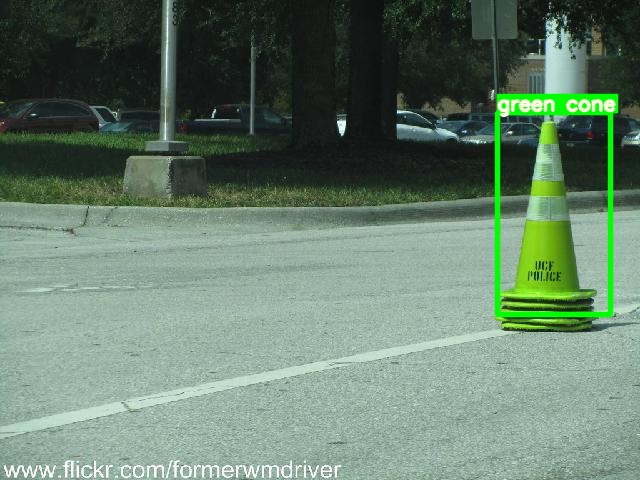

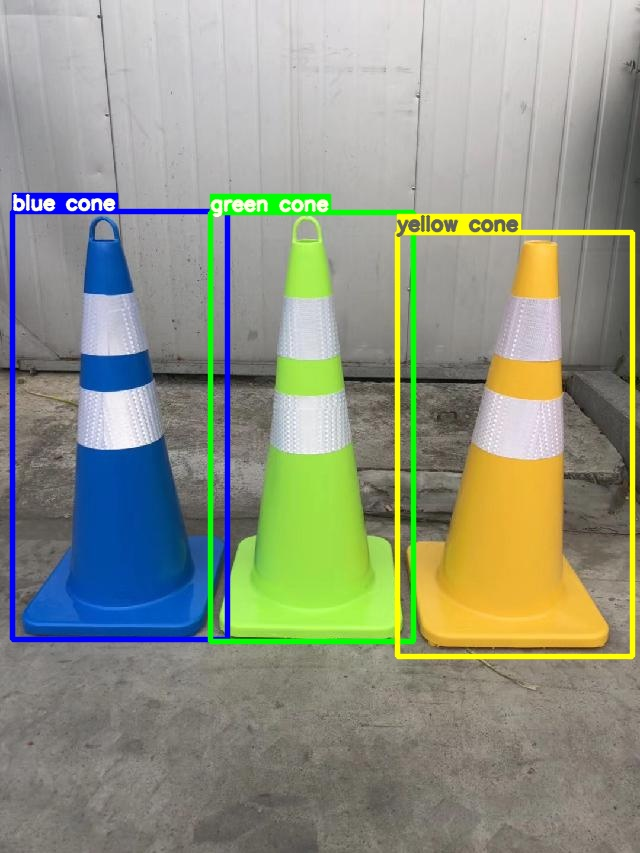

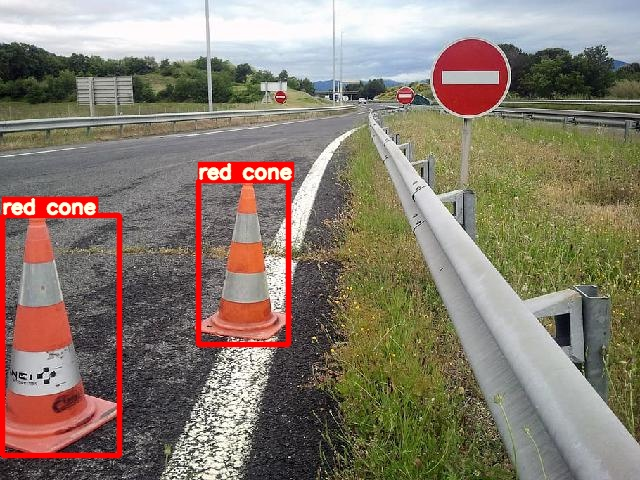

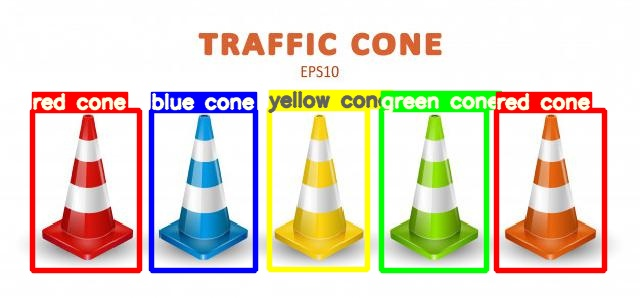

...

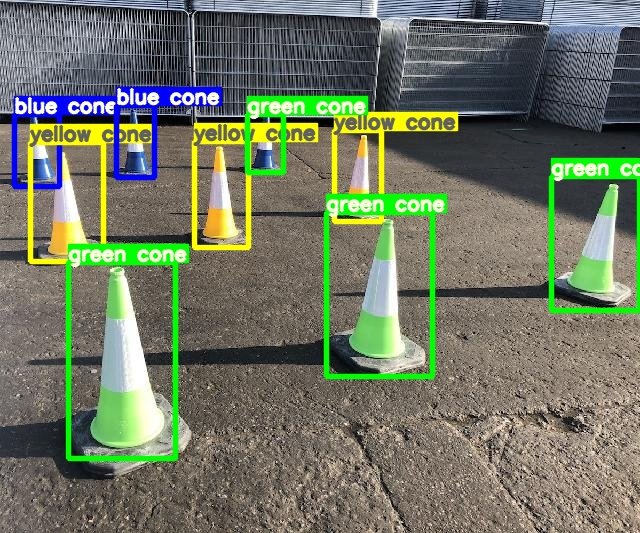

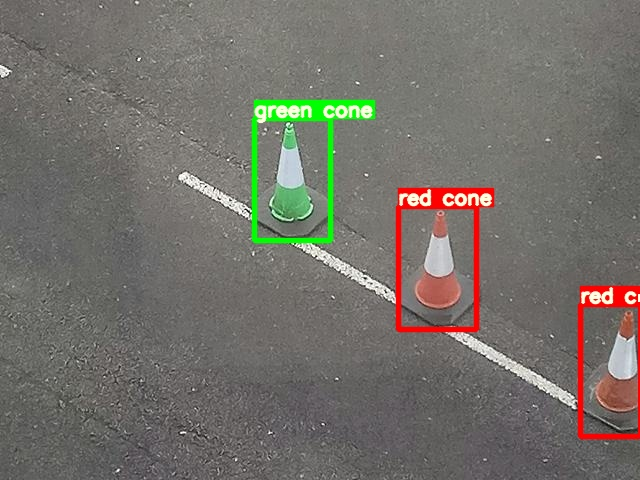

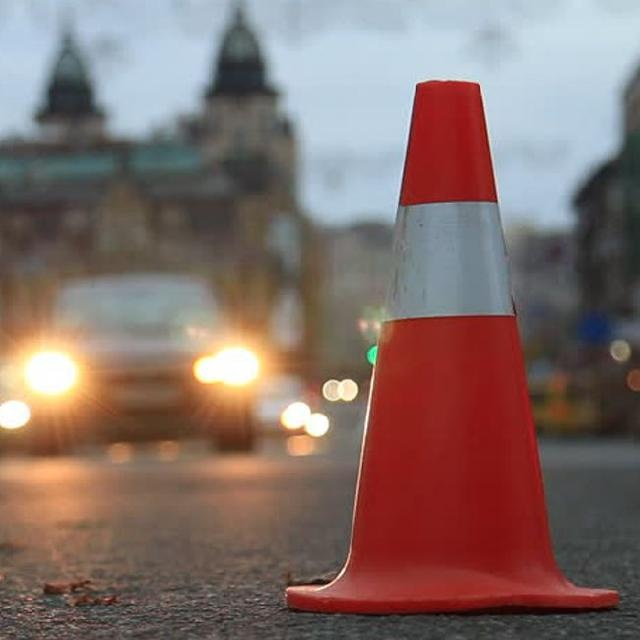

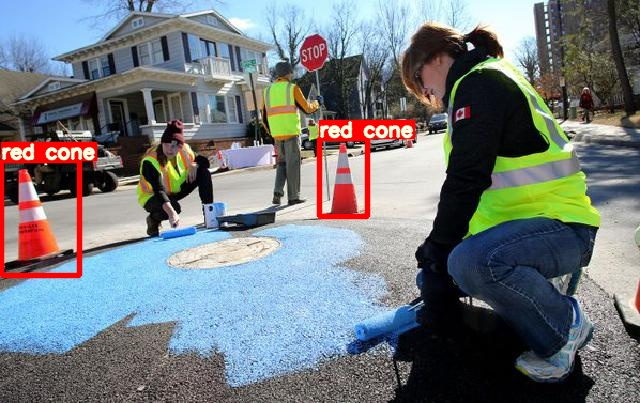

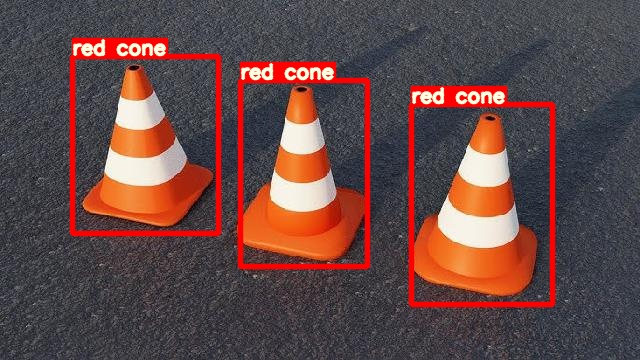

In [27]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp7/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [28]:
# update customized files
%cp /content/yolov5/detect.py /content/gdrive/MyDrive/cones
%cp /content/yolov5/utils/plots.py /content/gdrive/MyDrive/cones